In [1]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import sympy as sym

In [2]:
nb_dir = os.path.split(os.getcwd())[0]
if nb_dir not in sys.path:
    sys.path.append(nb_dir)

In [98]:
import metrics.metrics as met
import utils.basic_geodesic_plotter as bgp
import utils.symbolic_variables as vrs

from geodesics_from_metric import geodesic_from_metric
from line_element_to_metric_tensor import line_element_to_metric_tensor

In [6]:
q, dq, line_element, params_sym = met.schwarzchild_metric()

In [7]:
params_sym

Matrix([[M]])

In [8]:
q

Matrix([
[    t],
[    r],
[theta],
[  phi]])

In [9]:
dq

Matrix([
[    dt],
[    dr],
[dtheta],
[  dphi]])

In [10]:
line_element

-dr**2/(-2*M/r + 1) + dt**2*(-2*M/r + 1) - r**2*(dphi**2*sin(theta)**2 + dtheta**2)

In [11]:
line_element_to_metric_tensor(line_element, dq)

Matrix([
[-2*M/r + 1,               0,     0,                   0],
[         0, -1/(-2*M/r + 1),     0,                   0],
[         0,               0, -r**2,                   0],
[         0,               0,     0, -r**2*sin(theta)**2]])

In [97]:
# intial conditions
metric_tensor_params = [1] # M=1
q0 = np.array(
    [
     [0, 40, np.pi / 2, 0],
      [0, 40, np.pi / 2, 0]
     ]
).T
q0 = np.concatenate(
    [
        q0,
        np.concatenate(
            [
                np.zeros(10).reshape(1, -1),
                np.random.normal(loc=0, scale=10, size=(3, 10))
            ],
            axis=0
        )
    ],
    axis=1
)

# initial 3-momentum
p0 = np.array(
    [
     [0, 0, 3.83405],
      [0, 0, 4.83405]
     ]
).T
p0 = np.concatenate(
    [
        p0,
        np.random.normal(loc=0, scale=2, size=(3, 10))
    ],
    axis=1
)

In [99]:
# geodesic
n_timesteps = 5500 * 1
delta = 0.5 ** 1
geod = geodesic_from_metric(
    q, 
    dq,
    line_element,
    params_sym,
    q0, 
    p0, 
    metric_tensor_params,
    n_timesteps,
    delta, 
    omega=1,
    order=2 * 1, 
    timelike=True,
    solve_p0_zeroth_term=True,
    neg_g_inv=False
)

CAUGHT: Invalid comparison of non-real 0.970191687750295*I
Trying g_sym_inv = -g_sym_inv...

[[ 0.         40.          1.57079633  0.        ]
 [-0.97914661  0.          0.          3.83405   ]
 [ 0.         40.          1.57079633  0.        ]
 [-0.97914661  0.          0.          3.83405   ]]
On iteration number 0 with delta 0.5
On iteration number 1000 with delta 0.5
On iteration number 2000 with delta 0.5
On iteration number 3000 with delta 0.5
On iteration number 4000 with delta 0.5
On iteration number 5000 with delta 0.5
12.850373600000239 -- sec to complete geodesic calculations.


In [100]:
eqns_motion = np.array([g[0, :, :] for g in geod]) # shape (n_timesteps, n_coords, n_particles)


# convert to cartesian for Schwarzchild/Kerr
def schwarzchild_to_cartesian(eqns_motion, a):
    cart_eqns_motion = np.zeros_like(eqns_motion)
    cart_eqns_motion[:, 0, :] = eqns_motion[:, 0, :]
    # Eddington–Finkelstein coordinates
    cart_eqns_motion[:, 1, :] = (
        np.sqrt(a ** 2 + eqns_motion[:, 1, :] ** 2) 
        * np.sin(eqns_motion[:, 2, :]) 
        * np.cos(eqns_motion[:, 3, :])
    )
    cart_eqns_motion[:, 2, :] = (
        np.sqrt(a ** 2 + eqns_motion[:, 1, :] ** 2)
        * np.sin(eqns_motion[:, 2, :]) 
        * np.sin(eqns_motion[:, 3, :])
    )
    cart_eqns_motion[:, 3, :] = eqns_motion[:, 1, :]  * np.cos(eqns_motion[:, 2, :])
    return cart_eqns_motion

a = 0 # schwarzchild
cart_eqns_motion = schwarzchild_to_cartesian(eqns_motion, a)
print(f'{cart_eqns_motion.shape} -- shape of equations of motion')

(5501, 4, 12) -- shape of equations of motion


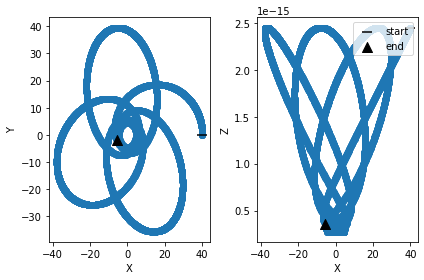

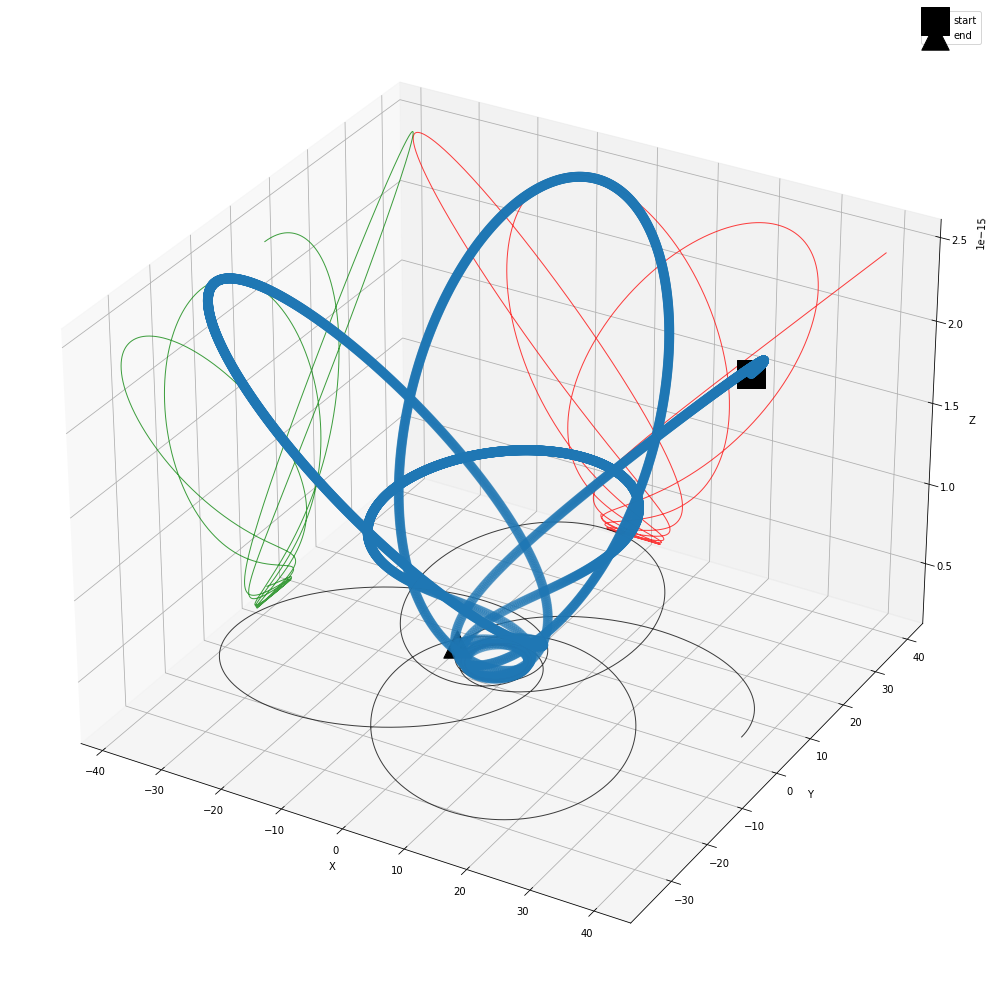

In [101]:
# plot single particle
bgp.geodesic_plotter_3d(
    cart_eqns_motion[:, 1, 0],
    cart_eqns_motion[:, 2, 0],
    cart_eqns_motion[:, 3, 0],
    axes_names=['X', 'Y', 'Z']
)

In [102]:
i,j,k = cart_eqns_motion.shape
cart_eqns_motion_2d = np.column_stack(
    (
        np.repeat(np.arange(k), i),
         cart_eqns_motion.transpose(2, 0, 1).reshape(k * i, -1)
    )
)
del i, j, k

df = pd.DataFrame(cart_eqns_motion_2d, columns=['particle', 't', 'x', 'y', 'z'])

# t = np.linspace(0, len(geod), len(geod))
# fig = go.Figure(
#     data=[
#         go.Scatter3d(
#             x=cart_eqns_motion[:, 1, 0],
#             y=cart_eqns_motion[:, 2, 0],
#             z=cart_eqns_motion[:, 3, 0],
#             mode='markers',
#             marker=dict(
#                 size=2,
#                 color=t,                # set color to an array/list of desired values
#                 colorscale='Viridis',   # choose a colorscale
#                 opacity=0.8
#             )
#         )
#     ],
#     layout = go.Layout(
#         autosize=False,
#         width=1000,
#         height=1000,
#     )
# )
# fig.show()
# del fig, t

import pandas as pd
import plotly.express as px


### this works!!!
# fig = px.scatter_3d(
#     df,
#     x='x',
#     y='y',
#     z='z',
#     color='t',
#     symbol='particle',
#     opacity=0.7,
#     width=1000,
#     height=1000,
#     animation_frame='particle'
# )
# fig.update_traces(
#     marker=dict(
#         size=2
#     )
# )
# fig.update_layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0,
#     )
# )
# fig.update_layout(
#     legend=dict(
#         yanchor="top",
#         y=0.99,
#         xanchor="left",
#         x=0.01
#     )
# )
# fig["layout"].pop("updatemenus") # optional, drop animation buttons
# fig.show()
# del fig


# Create figure
fig = go.Figure(
    layout = go.Layout(
        autosize=False,
        width=1000,
        height=1000,
    )
)

# Add traces, one for each slider step
for i in range(cart_eqns_motion.shape[2]):
    fig.add_trace(
        go.Scatter3d(
            x=df[df['particle'] == i]['x'].values,
            y=df[df['particle'] == i]['y'].values,
            z=df[df['particle'] == i]['z'].values,
            mode='markers',
            marker=dict(
                size=2,
                color=df[df['particle'] == i]['t'].values,                # set color to an array/list of desired values
                colorscale='Viridis',   # choose a colorscale
                opacity=0.8
            ),
        )
    )
    
# Make 0th trace visible
fig.data[0].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method='update',
        args=[
            {'visible': [False] * len(fig.data)},
            {'title': f'Particle {i}'}
         ],
    )
    step['args'][0]['visible'][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=0,
    currentvalue={'prefix': 'particle: '},
    pad={"t": cart_eqns_motion.shape[2]},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)
fig.update_layout(
    showlegend=False
)
fig.show()
del fig, i, steps, sliders